In [108]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from keras import layers, models
import pathlib
import os
import cv2
import string
from keras.metrics import Accuracy, Precision, Recall
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.metrics import f1_score
import seaborn as sns
import pandas as pd

- Breast cancer is one of the most common causes of death among women worldwide. Early detection helps reduce the number of premature deaths. Data reviews medical images of breast cancer using ultrasound. The breast ultrasound dataset is categorized into three categories: normal, benign, and malignant images.
- In the study, I am working on creating a convolutional neural network capable of identifying tumor areas within medical images (which were taken with ultrasound).
- Through the following study, I am working on producing a highly efficient Segmentation model with the ability to generalize and identify the cancer area, regardless of the type or area of cancer.
- The methodology used in the study depended on many factors. Initially, all medical images were used, whether (malignant cancer, benign cancer, or images that did not contain any cancer).
- The U-NET structure was used in addition to making the neural network predict the types of cancer that it selects. I believe that making the neural network carry out additional tasks helps increase the accuracy of the model and its ability to generalize the results it reaches.
- The proposed structure of the neural network tries to build a system capable of understanding the following sentence: "What type of cancer does the patient suffer from? Is it malignant cancer? Or is it benign cancer? Or is there no cancer?" After answering the first question, we move on to the second question, where is the cancerous tumor located In medical images?
- The previous sentence helps the neural network to accurately determine the area of ​​the cancerous tumor after knowing the type of cancer.
- But to facilitate the discovery of the cancer region in the medical images, the MSE loss function was used to determine the two types of cancer, which makes the loss function derivable and continuous at any moment, which facilitates the training process, and makes the neural network able to find the link between the cancer tumor area and its shape with the two types of cancer tumor.
- As we mentioned, a stable training must be found between recognizing the two types of cancerous tumors, and identifying the cancerous tumor area in the medical image (as we mentioned, this helps in the ability to know the shape and characteristics of the cancerous tumor easier and faster).
- On the other hand, in order not to make the neural network focus only on the dark area in the medical images, DATA_AUGMENTATION was used to make each medical image (as it is, lighter by adding lighting, darker by using contrast).

# Preparation of dataset images:

In [25]:
class readDataset:
    def __init__(self, datasetpath, imageShape):
        self.datasetpath = datasetpath
        self.imageShape = imageShape
    def imagesPath(self, folder, name):
        images = list(pathlib.Path(os.path.join(self.datasetpath, 
                                                folder)).glob('*{}.*'.format(name)))
        return images
    def readImages(self, images, channels):
        listImages = []
        images = np.sort(images)
        for image in images:
            image = tf.io.read_file(str(image))
            image = tf.image.decode_png(image, channels = channels)
            image = tf.image.resize(image, self.imageShape)
            image/= 255
            listImages.append(image)
        return listImages
    def allDataset(self, label):
        images = self.readImages(self.imagesPath(label, name = ')'), channels = 3)
        masks = np.array(self.readImages(self.imagesPath(label, name = 'mask'), channels = 1))
        masks = (masks >= 0.5).astype('int32')
        return np.array(images), masks
    def finalDataset(self, labels):
        images_benign, masks_benign = self.allDataset(labels[0])
        images_malignant, masks_malignant = self.allDataset(labels[1])
        images_normal, masks_normal = self.allDataset(labels[2])
        images = np.vstack([images_benign, images_malignant, images_normal])
        masks = np.vstack([masks_benign, masks_malignant, masks_normal])
        labels = np.hstack([np.ones(shape = (len(images_benign),))*0,
                           np.ones(shape = (len(images_malignant), ))*1, 
                           np.ones(shape = (len(images_normal), ))*2])
        return images, masks, labels
    def dataAugmentation(self, images, masks, labels):
        imagesupdate = []
        masksupdate = []
        labelsupdate = []
        for image, mask, label in zip(images, labels, masks):
            image1 = tf.image.adjust_contrast(image, contrast_factor = 2)
            image2 = tf.image.adjust_brightness(image, delta = 0.3)
            imagesupdate.append(image), masksupdate.append(mask), labelsupdate.append(label)
            imagesupdate.append(image1), masksupdate.append(mask), labelsupdate.append(label)
            imagesupdate.append(image2), masksupdate.append(mask), labelsupdate.append(label)
        return np.array(imagesupdate), np.array(masksupdate), np.array(labelsupdate)

In [26]:
datasetpath = '/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT'
datasetObject = readDataset(datasetpath, [128, 128])
images, masks, labels = datasetObject.finalDataset(['benign', 'malignant', 'normal'])

In [27]:
images, masks, labels = datasetObject.dataAugmentation(images, labels, masks)
images.shape, masks.shape, labels.shape

((2340, 128, 128, 3), (2340, 128, 128, 1), (2340,))

In [28]:
np.unique(labels, return_counts = True)

(array([0., 1., 2.]), array([1311,  630,  399]))

In [29]:
def showImagesWithMask(images, masks, labels):
    plt.figure(figsize = (12, 12))
    for i in range(len(images)):
        plt.subplot(8, 8, (i + 1))
        plt.imshow(images[i])
        plt.imshow(masks[i], alpha = 0.3, cmap = 'jet')
        plt.title(labels[i])
    plt.legend()

Reviewing samples of dataset images, after DATA_AUGMENTATION has been applied to them, and we notice the difference in lighting and brightness, as for each image 3 images were obtained.

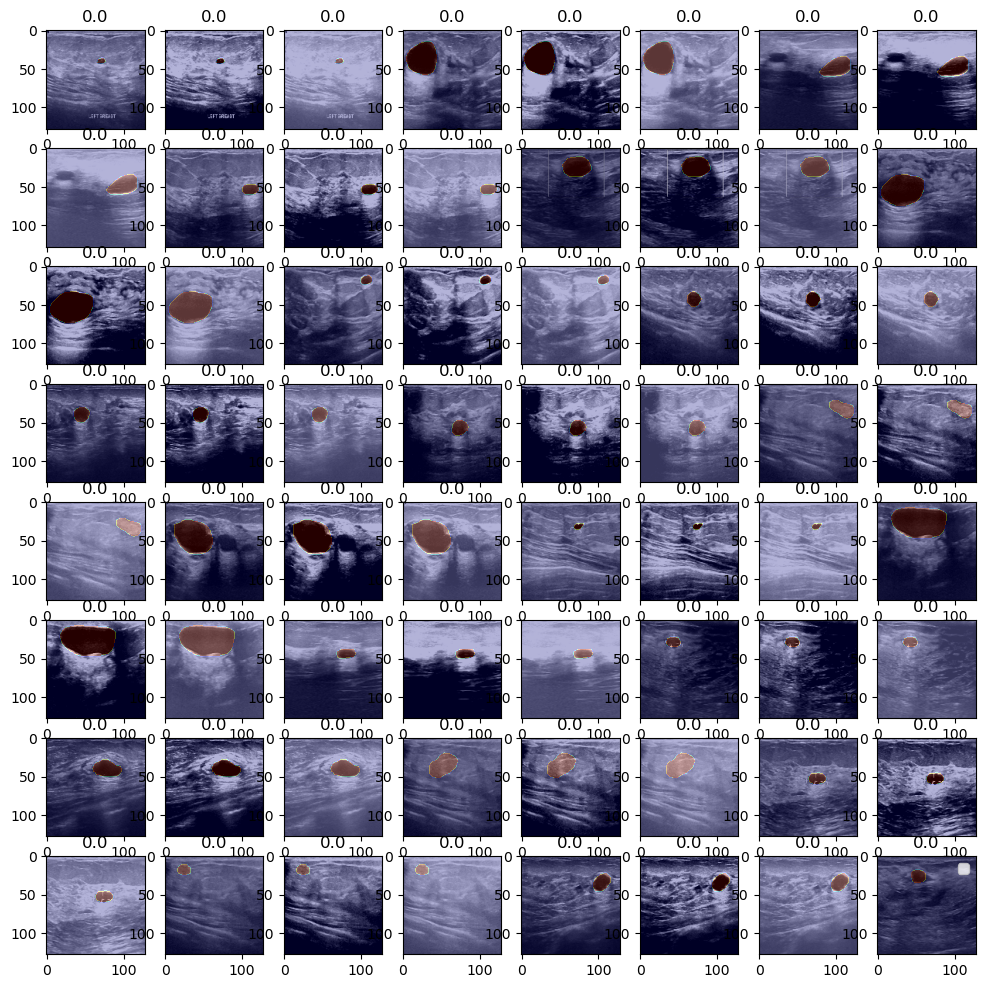

In [30]:
showImagesWithMask(images[:64], masks[:64], labels[:64])

# Divide the dataset into training and test images.

In [31]:
randomIndexs = np.random.randint(0, len(images), size = (len(images), ))
images = images[randomIndexs]
masks = masks[randomIndexs]
labels = labels[randomIndexs]
images.shape, masks.shape, labels.shape

((2340, 128, 128, 3), (2340, 128, 128, 1), (2340,))

In [32]:
valid = 500
trainDataset = [images[:images.shape[0] - valid], 
         masks[:images.shape[0] - valid], 
         labels[:images.shape[0] - valid]]
validDataset = [images[images.shape[0] - valid:], 
         masks[images.shape[0] - valid:], 
         labels[images.shape[0] - valid:]]

In [33]:
trainDataset[0].shape, trainDataset[1].shape, trainDataset[2].shape

((1840, 128, 128, 3), (1840, 128, 128, 1), (1840,))

In [34]:
validDataset[0].shape, validDataset[1].shape, validDataset[2].shape

((500, 128, 128, 3), (500, 128, 128, 1), (500,))

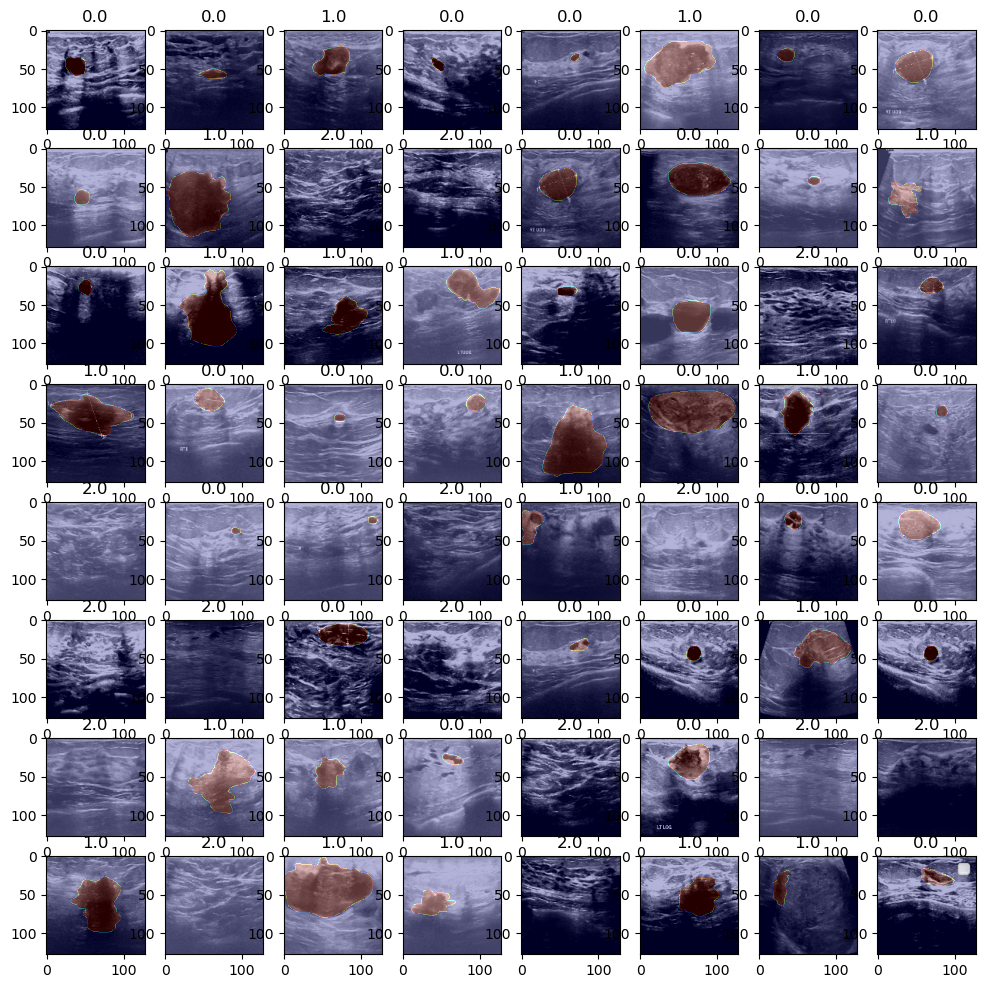

In [35]:
showImagesWithMask(trainDataset[0][:64], trainDataset[1][:64], trainDataset[2][:64])

# Neural network architecture proposal:
We note that in the proposed neural network architecture, the additional task in determining the type of cancerous tumor is in the coding part within the U-NET architecture.

In [36]:
def convolution(inputs, padding, strides, filter, kernel_size):
    x = inputs
    y = layers.Conv2D(filter, kernel_size = 1, padding = padding, 
                     strides = strides, 
                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(x)
    x = layers.Conv2D(filter, kernel_size = kernel_size, padding = padding, 
                     strides = strides, 
                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(y)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filter, kernel_size = kernel_size, padding = padding, 
                     strides = strides, 
                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.add([x, y])
    x = layers.Activation('relu')(x)
    return x

In [37]:
def encoder(inputs, filter):
    correlation = convolution(inputs, padding = 'same', strides = 1, filter = filter, 
                             kernel_size = 5)
    downsample = layers.AveragePooling2D()(correlation)
    return correlation, downsample

In [38]:
def decoder(inputs, skip_connection, filter):
    upsample = layers.Conv2DTranspose(filter, 5, padding = 'same', strides = 2, 
                                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(inputs)
    upsample = layers.Activation('relu')(upsample)
    upsample = layers.BatchNormalization()(upsample)
    connection = layers.average([upsample, skip_connection])
    correlation = convolution(connection, padding = 'same', strides = 1, filter = filter, 
                             kernel_size = 5)
    return correlation

In [68]:
input = layers.Input(shape = (128, 128, 3))
filter = 32
corr1, downsample1 = encoder(input, filter)
corr2, downsample2 = encoder(downsample1, filter*2)
corr3, downsample3 = encoder(downsample2, filter*4)
corr4, downsample4 = encoder(downsample3, filter*8)
downsample4 = convolution(downsample4, padding = 'same', strides = 1, filter = filter*8, 
                         kernel_size = 5)
features_vector_1 = layers.GlobalAveragePooling2D()(downsample4)
features_vector_2 = layers.Flatten()(downsample4)
features_vector_2 = layers.Dropout(0.5)(features_vector_2)
features_vector_1 = layers.Dropout(0.5)(features_vector_1)
encoder_x = layers.Dense(64, name = 'latent_space', 
                kernel_regularizer = tf.keras.regularizers.L2(0.001))(features_vector_1)
x = layers.Dense(downsample4.shape[1]*downsample4.shape[2]*downsample4.shape[3], 
                kernel_regularizer = tf.keras.regularizers.L2(0.001))(encoder_x)
x = layers.Reshape((downsample4.shape[1], downsample4.shape[2], downsample4.shape[3]), 
                  name = 'reshape')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
decoder_corr1 = decoder(x, corr4, filter*8)
decoder_corr2 = decoder(decoder_corr1, corr3, filter*4)
decoder_corr3 = decoder(decoder_corr2, corr2, filter*2)
decoder_corr4 = decoder(decoder_corr3, corr1, filter)
output = layers.Conv2DTranspose(1, 5, padding = 'same', strides = 1)(decoder_corr4)
output = layers.Activation('sigmoid', name = 'UNET')(output)
labelOutput = layers.Dense(32, activation = 'relu')(features_vector_2)
labelOutput = layers.BatchNormalization()(labelOutput)
labelOutput = layers.Dropout(0.5)(labelOutput)
labelOutput = layers.Dense(16, activation = 'relu')(labelOutput)
labelOutput = layers.BatchNormalization()(labelOutput)
labelOutput = layers.Dropout(0.5)(labelOutput)
labelOutput = layers.Dense(1, name = 'label')(labelOutput)
m = models.Model(inputs = input, outputs = [output, labelOutput])
m.compile(loss = [tf.keras.losses.BinaryFocalCrossentropy(), 'mae'], 
          optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), 
          metrics = ['accuracy', Precision(name = 'precision'), Recall(name = 'recall')], 
          )
m.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_303 (Conv2D)            (None, 128, 128, 32  128         ['input_12[0][0]']               
                                )                                                                 
                                                                                                  
 conv2d_304 (Conv2D)            (None, 128, 128, 32  25632       ['conv2d_303[0][0]']             
                                )                                                           

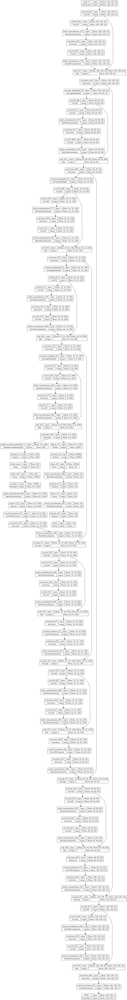

In [11]:
tf.keras.utils.plot_model(m,
                            show_shapes=True,
                            show_layer_names=True,)

In [69]:
history = m.fit(trainDataset[0], [trainDataset[1], trainDataset[2]], epochs = 260, 
               validation_data = (validDataset[0], [validDataset[1], validDataset[2]]), 
               batch_size = 8, callbacks = [
                   tf.keras.callbacks.EarlyStopping(patience = 12, monitor = 'val_loss', 
                                                   mode = 'min', restore_best_weights = True)
               ])

Epoch 1/260


2023-07-05 12:00:10.404428: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_9/dropout_52/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


230/230 [==============================] - 49s 105ms/step - loss: 5.9479 - UNET_loss: 0.1282 - label_loss: 1.6320 - UNET_accuracy: 0.7981 - UNET_precision: 0.0983 - UNET_recall: 0.1895 - label_accuracy: 0.4603 - label_precision: 0.4628 - label_recall: 0.3904 - val_loss: 4.8613 - val_UNET_loss: 0.0845 - val_label_loss: 0.6712 - val_UNET_accuracy: 0.9112 - val_UNET_precision: 0.0027 - val_UNET_recall: 1.1035e-05 - val_label_accuracy: 0.3180 - val_label_precision: 0.4298 - val_label_recall: 0.9395
Epoch 2/260
230/230 [==============================] - 23s 99ms/step - loss: 5.6752 - UNET_loss: 0.0629 - label_loss: 1.5918 - UNET_accuracy: 0.9140 - UNET_precision: 0.4062 - UNET_recall: 0.1853 - label_accuracy: 0.4511 - label_precision: 0.4464 - label_recall: 0.3744 - val_loss: 4.7145 - val_UNET_loss: 0.0750 - val_label_loss: 0.6998 - val_UNET_accuracy: 0.9128 - val_UNET_precision: 0.7826 - val_UNET_recall: 0.0202 - val_label_accuracy: 0.5200 - val_label_precision: 0.4823 - val_label_recall: 

# Results and metrics:
- Several performance measures were used to evaluate the performance of the neural network in determining the area of the cancerous tumor in the medical images, in addition to many curves that express the training and verification process for each of the training and verification data, for many measures in order to study the performance of the neural network during the training phase.
- This is followed by a number of measures that express the performance of the neural network on verification data and training data, which determine the amount of the neural network's ability to generalize the results it was able to reach.

In [72]:
m.evaluate(trainDataset[0], [trainDataset[1], trainDataset[2]])

58/58 [==============================] - 4s 62ms/step - loss: 1.7422 - UNET_loss: 0.0020 - label_loss: 0.4451 - UNET_accuracy: 0.9967 - UNET_precision: 0.9783 - UNET_recall: 0.9799 - label_accuracy: 0.6712 - label_precision: 0.8423 - label_recall: 0.6909


[1.7422298192977905,
 0.0020397291518747807,
 0.4450533986091614,
 0.996682345867157,
 0.9782916903495789,
 0.9798603653907776,
 0.6711956262588501,
 0.8423423171043396,
 0.6908866763114929]

In [73]:
m.evaluate(validDataset[0], [validDataset[1], validDataset[2]])

16/16 [==============================] - 1s 62ms/step - loss: 1.7572 - UNET_loss: 0.0106 - label_loss: 0.4515 - UNET_accuracy: 0.9908 - UNET_precision: 0.9648 - UNET_recall: 0.9301 - label_accuracy: 0.6620 - label_precision: 0.7419 - label_recall: 0.6419


[1.7571907043457031,
 0.01060060691088438,
 0.45145341753959656,
 0.9908159375190735,
 0.9648165106773376,
 0.9301360249519348,
 0.6620000004768372,
 0.7419354915618896,
 0.6418604850769043]

- As we mentioned earlier, we were adding an additional task to the neural network, which is checking the type of cancer tumor, it had an impact on the segmentation process.
- We note in the rest of the diagrams that at first there was no stability in the curve, because I mentioned at the beginning that I wanted to create a stable training between two basic tasks (the Segmentation process for the cancerous tumor area, and the process of determining the type of cancerous tumor).
- The use of the MSE loss function in determining the type of cancer tumor had the best performance in achieving stable training between the Segmentation process and the process of determining the type of cancer tumor, because the neural network predicts both tasks at the same time, and thus adding the new task helps the network to focus in the Segmentation process .
- The loss function MSE is continuous and can be differentiated at any time, and the neural network needs to reach a very high loss rate, which forces the neural network to search for distinguishing features of each type of cancerous tumor to be added as a new task in the segmentation process.
What we care about in the end is the Segmentation process only.

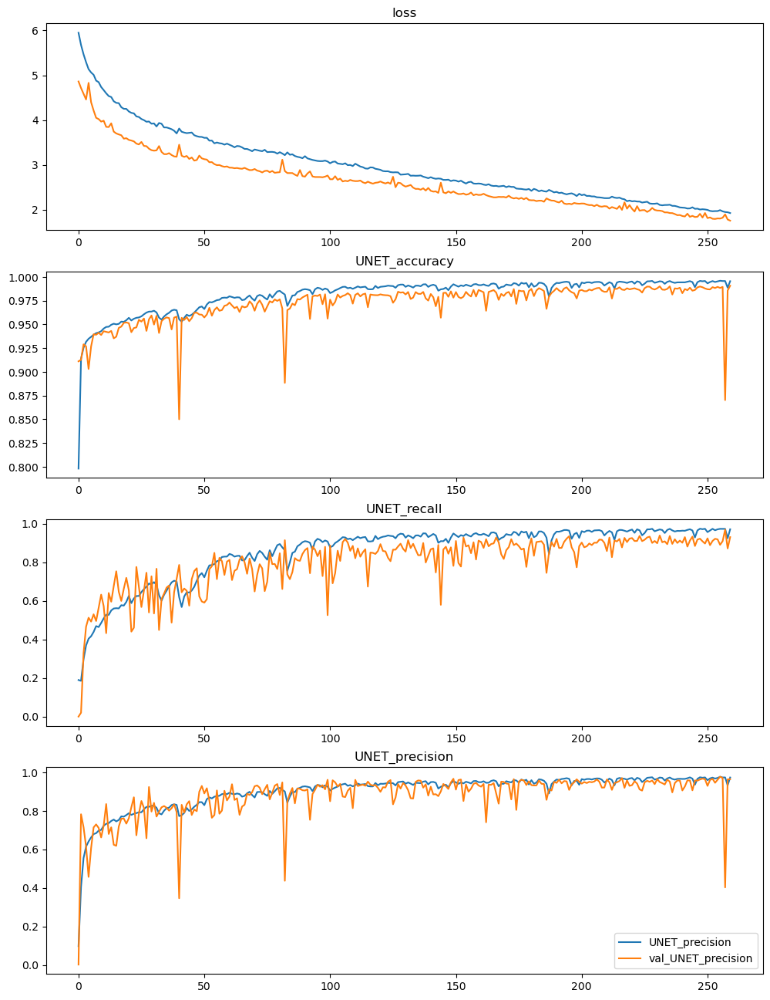

In [74]:
metrics = ['loss', 'UNET_accuracy', 'UNET_recall', 'UNET_precision']
plt.figure(figsize = (12, 16))
for i in range(4):
    plt.subplot(4, 1, (i + 1))
    plt.plot(history.history['{}'.format(metrics[i])], label = '{}'.format(metrics[i]))
    plt.plot(history.history['val_{}'.format(metrics[i])], label = 'val_{}'.format(metrics[i]))
    plt.title('{}'.format(metrics[i]))
plt.legend()

In [75]:
masks_pred, _ = m.predict(validDataset[0])

16/16 [==============================] - 1s 54ms/step


In [76]:
masks_pred.shape, validDataset[1].shape

((500, 128, 128, 1), (500, 128, 128, 1))

In [77]:
masks_pred = (masks_pred >= 0.5).astype('int32')
np.unique(masks_pred), np.unique(validDataset[1])

(array([0, 1], dtype=int32), array([0, 1], dtype=int32))

In [78]:
masks_pred = layers.Flatten()(masks_pred)
masks_pred  = np.reshape(masks_pred, -1)
masks_actual = layers.Flatten()(validDataset[1])
masks_actual  = np.reshape(masks_actual, -1)
masks_pred.shape, masks_actual.shape

((8192000,), (8192000,))

In [135]:
print(classification_report(masks_actual, masks_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99   7467063
           1       0.96      0.93      0.95    724937

    accuracy                           0.99   8192000
   macro avg       0.98      0.96      0.97   8192000
weighted avg       0.99      0.99      0.99   8192000



In [125]:
tn, fp, fn, tp = confusion_matrix(masks_actual, masks_pred).ravel()

In [133]:
metrics = pd.DataFrame([accuracy_score(masks_actual, masks_pred)*100,
                        precision_score(masks_actual, masks_pred)*100,
                        recall_score(masks_actual, masks_pred)*100,
                        f1_score(masks_actual, masks_pred)*100,
                        (tn / (tn+fp))*100,
                        (2*tp/(2*tp + fp + fn))*100,
                        (tp/(tp + fn))*100],
                       index = ['Accuracy Score', 'Precision Score',
                                'Recall Score', 'F1 Score', 'specificity', 
                                'dice Score', 'sensitivity'], 
                       columns = ['Metrics For Validation Data'])
metrics.head(n= 8)

,Metrics For Validation Data
Accuracy Score,99.081458
Precision Score,96.481197
Recall Score,93.012496
F1 Score,94.715099
specificity,99.670660
dice Score,94.715099
sensitivity,93.012496


In [92]:
def segmentation(data):
    masks_pred, _ = m.predict(data)
    masks_pred = np.array(masks_pred)
    masks_pred = (masks_pred >= 0.5).astype('int32')
    return masks_pred

In [96]:
valid_masks = segmentation(validDataset[0])
valid_masks.shape

16/16 [==============================] - 1s 54ms/step


(500, 128, 128, 1)

# Visual review of the results:
In this part, we review the truncation process that was made on each of the test and training data, and compare the predicted masks with the true masks.

In [99]:
def draw(images, masks, y_pred):
  plt.figure(figsize = (12, 25))
  index = -1
  n = np.random.randint(y_pred.shape[0])
  for i in range(60):
    plt.subplot(10, 6, (i + 1))
    if index == -1:
      plt.imshow(images[n])
      plt.title('Image')
      index = 0
    elif index == 0:
      plt.imshow(images[n])
      plt.imshow(masks[n], alpha = 0.3, cmap = 'jet')
      plt.title('Original Mask')
      index = 1
    elif index == 1:
      plt.imshow(images[n])
      plt.imshow(np.reshape(y_pred[n], (128, 128)), alpha = 0.3, cmap = 'jet')
      plt.title('Predict Mask')
      index = -1
      n = np.random.randint(y_pred.shape[0])
  plt.legend()

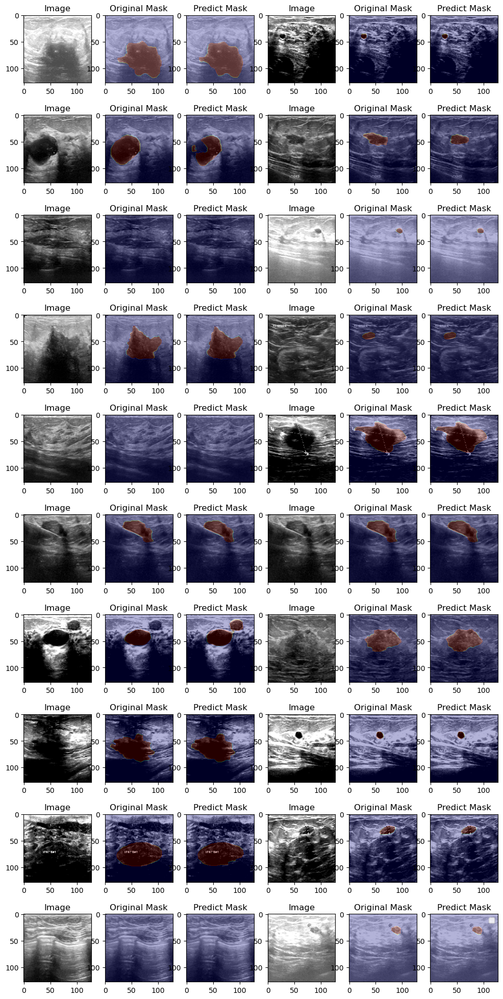

In [100]:
draw(validDataset[0], validDataset[1], valid_masks)

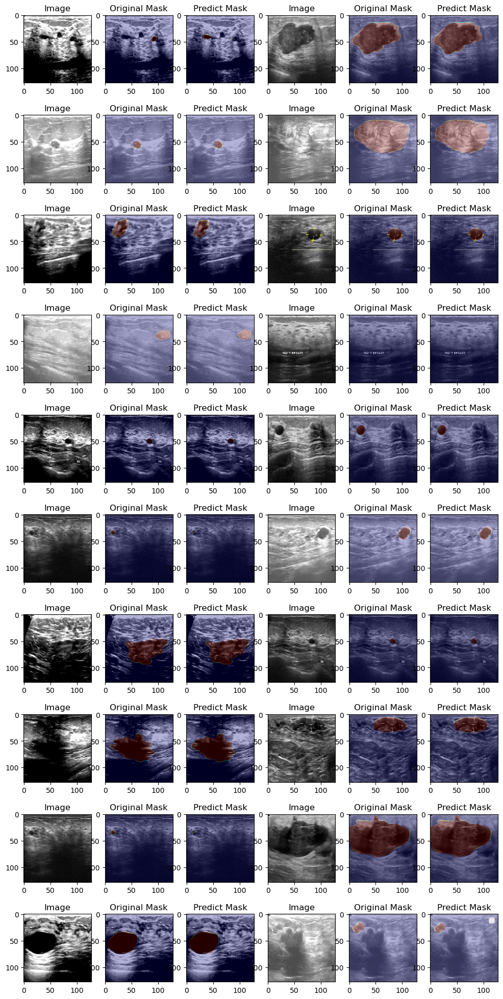

In [101]:
draw(validDataset[0], validDataset[1], valid_masks)

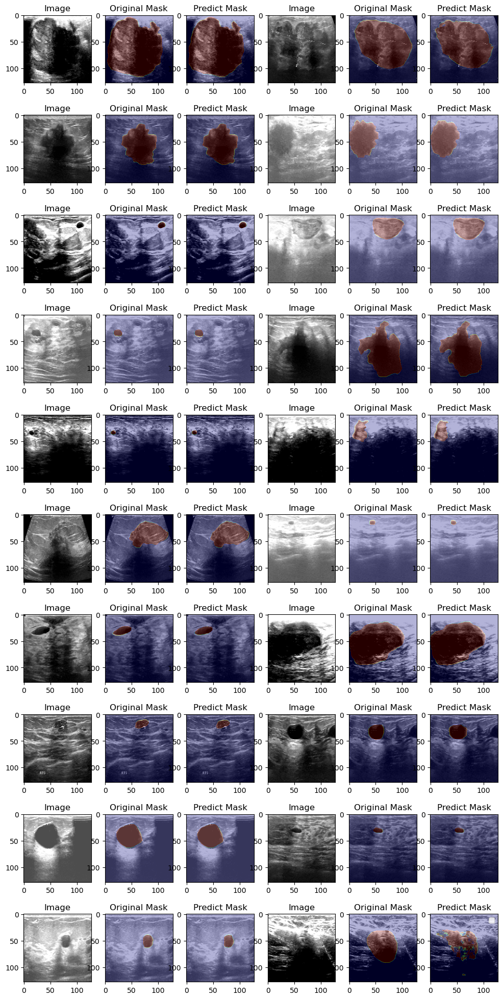

In [102]:
draw(validDataset[0], validDataset[1], valid_masks)

In [103]:
train_masks = segmentation(trainDataset[0])
train_masks.shape

58/58 [==============================] - 3s 53ms/step


(1840, 128, 128, 1)

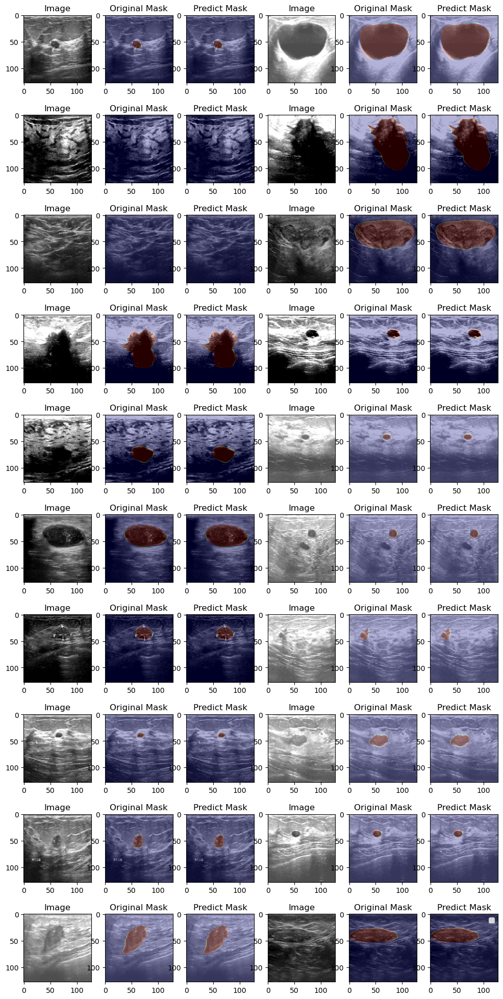

In [104]:
draw(trainDataset[0], trainDataset[1], train_masks)

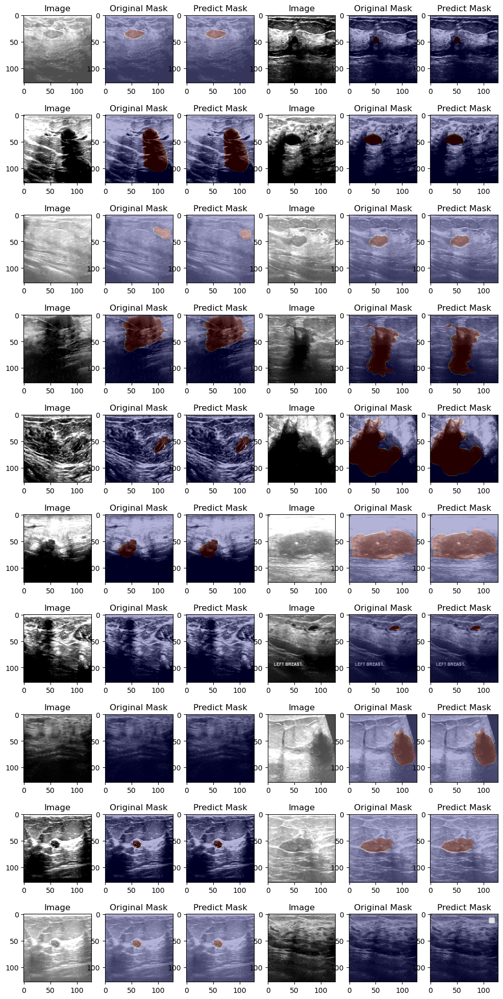

In [105]:
draw(trainDataset[0], trainDataset[1], train_masks)

In [106]:
m.save('/kaggle/working/breast_cancer_segmentation.h5')